## All imports used in this notebook

In [1]:
import netCDF4
from pathlib import Path
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from mpl_toolkits.axes_grid1 import axes_grid
from mpl_toolkits.axes_grid1 import ImageGrid
from utils.config import LINEAR_ENCODER
from utils import CROP_ENCODING
from glob import glob

## A function to load band data and display parameters from a patch into a dict

In [2]:
def load_patch_file(patch_file):
    patch = netCDF4.Dataset(Path(patch_file), 'r')
    return patch, {
        'B02':  {
            'title': 'B02 - Blue',
            'band': xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B02'])).B02,
            'uint8': np.array((xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B02'])).B02 / 16).astype(np.uint8)),
            'plotc': 'b'
            },
        'B03': {
            'title': 'B03 - Green',
            'band': xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B03'])).B03,
            'uint8': np.array((xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B03'])).B03 / 16).astype(np.uint8)),
            'plotc': 'g'
        },
        'B04':   {
            'title': 'B04 - Red',
            'band': xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B04'])).B04,
            'uint8': np.array((xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B04'])).B04 / 16).astype(np.uint8)),
            'plotc': 'r'
        },
        'B08':   {
            'title': 'B08 - NIR',
            'band': xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B08'])).B08,
            'uint8': np.array((xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B08'])).B08 / 16).astype(np.uint8)),
            'plotc': 'y'
        },
        'parcels': xr.open_dataset(xr.backends.NetCDF4DataStore(patch['parcels'])),
        'labels': xr.open_dataset(xr.backends.NetCDF4DataStore(patch['labels'])),
        'name': patch.patch_name,
        'file': patch_file
    }

## Show available patch files

Display the count and the first 5

In [3]:
files = sorted(glob('dataset/netcdf/*.nc'))
print(f'{len(files)} NetCDF4 files')
print(files[0:5])

300 NetCDF4 files
['dataset/netcdf/2019_31TBF_patch_17_11.nc', 'dataset/netcdf/2019_31TBF_patch_17_12.nc', 'dataset/netcdf/2019_31TBF_patch_17_13.nc', 'dataset/netcdf/2019_31TBF_patch_18_11.nc', 'dataset/netcdf/2019_31TBF_patch_18_12.nc']


## Show the name of one specific patch file from the array

In [4]:
files[2]

'dataset/netcdf/2019_31TBF_patch_17_13.nc'

## Load and display a patch

In [5]:
patch, patch_data = load_patch_file(files[2])
patch

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    title: S4A Patch Dataset
    authors: Papoutsis I., Sykas D., Zografakis D., Sdraka M.
    patch_full_name: 2019_31TBF_patch_17_13
    patch_year: 2019
    patch_name: patch_17_13
    patch_country_code: ES
    patch_tile: 31TBF
    creation_date: 27 Apr 2021
    references: Documentation available at .
    institution: National Observatory of Athens.
    version: 21.03
    _format: NETCDF4
    _nco_version: netCDF Operators version 4.9.1 (Homepage = http://nco.sf.net, Code = http://github.com/nco/nco)
    _xarray_version: 0.17.0
    dimensions(sizes): 
    variables(dimensions): 
    groups: B01, B02, B03, B04, B05, B06, B07, B08, B09, B10, B11, B12, B8A, labels, parcels

## Display band data, labels, and parcels

4 unique label indexes: [  0 330 353 442]
10 unique parcel ids: [      0 1097690 1098397 1098423 1098440 1098450 1098456 1100732 1100733
 1100734]


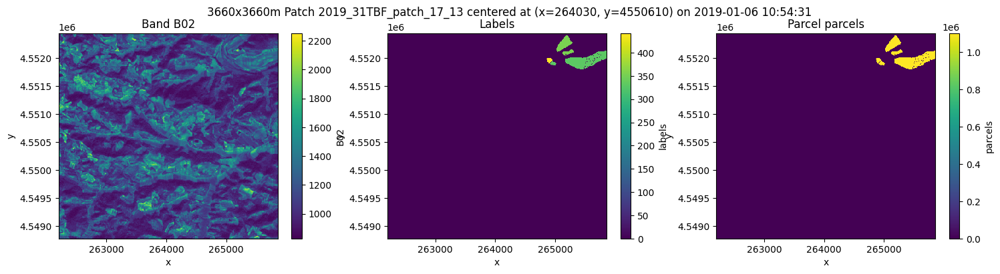

In [6]:
def show_patch(patch_data):

    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 4))

    # Extract location information -- only available in the parcel group
    x = (np.array(patch_data['parcels'].coords['x'])[-1] + np.array(patch_data['parcels'].coords['x'])[0]) / 2
    y = (np.array(patch_data['parcels'].coords['y'])[-1] + np.array(patch_data['parcels'].coords['y'])[0]) / 2
    band_data = patch_data['B02']['band']

    # Extract time information
    ftime = band_data.isel(time=0).time.dt.strftime("%Y-%m-%d %H:%M:%S").values
    fig.suptitle(f'3660x3660m Patch {patch.patch_full_name} centered at (x={x:.0f}, y={y:.0f}) on {ftime}')
    
    band_data.isel(time=0).plot(ax=ax[0])
    ax[0].set_title(f'Band B02')

    labels = np.unique(patch_data['labels'].to_dataarray())
    print(f'{len(labels)} unique label indexes:', labels)
    patch_data['labels'].labels.plot(ax=ax[1])
    ax[1].set_title('Labels')

    parcels = np.unique(patch_data['parcels'].parcels)
    print(f'{len(parcels)} unique parcel ids:', parcels)
    patch_data["parcels"].parcels.plot(ax=ax[2])
    ax[2].set_title(f'Parcel {patch_data["parcels"].parcels.name}')

show_patch(patch_data)

## Explore parcel properties

#### TODO: Attempt to convert to latitude and longitude

### Shape of a parcel

In [7]:
np.array(patch_data['parcels'].coords['x']).shape[0], np.array(patch_data['parcels'].coords['y']).shape[0]

(366, 366)

### First and last values of x

In [8]:
np.array(patch_data['parcels'].coords['x'])[0], np.array(patch_data['parcels'].coords['x'])[-1]

(262205.0, 265855.0)

### First and last values of y

In [9]:
np.array(patch_data['parcels'].coords['y'])[0], np.array(patch_data['parcels'].coords['y'])[-1]

(4552435.0, 4548785.0)

### Range of x

In [10]:
np.array(patch_data['parcels'].coords['x'])[-1] - np.array(patch_data['parcels'].coords['x'])[0]

3650.0

### Range of y

In [11]:
np.array(patch_data['parcels'].coords['y'])[-1] - np.array(patch_data['parcels'].coords['y'])[0]

-3650.0

## Display a list of all labels found in the patch

In [12]:
label_array = np.array(patch_data['labels'].to_dataarray()[0])
unique_indexes = np.unique(label_array)
print(unique_indexes)

[  0 330 353 442]


## Decode label names

In [13]:
CROP_DECODING = dict((v,k) for k, v in CROP_ENCODING.items())
CROP_DECODING[0] = "UNDEFINED"
fields = np.vectorize(CROP_DECODING.get)(unique_indexes)
print(fields)

['UNDEFINED' 'Grapes' 'Cherries and sour cherries' 'Olives']


## Mask a band of a by individual crop labels

In [14]:
band_array = np.array(patch_data['B02']['band'].isel(time=0))

olives = band_array.copy()
olives[label_array!=CROP_ENCODING['Olives']] = 0
grapes = band_array.copy()
grapes[label_array!=CROP_ENCODING['Grapes']] = 0
cherries = band_array.copy()
cherries[label_array!=CROP_ENCODING['Cherries and sour cherries']] = 0

## Show Labeled crops in an image

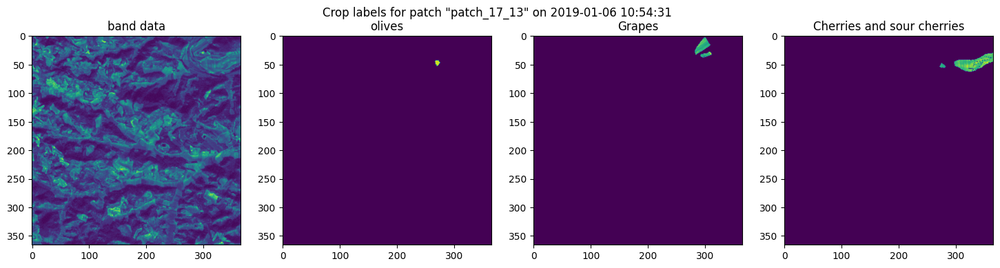

In [15]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(18, 4))
ftime = patch_data['B02']['band'].isel(time=0).time.dt.strftime("%Y-%m-%d %H:%M:%S").values
fig.suptitle(f'Crop labels for patch "{patch.patch_name}" on {ftime}')
ax[0].imshow(patch_data['B02']['band'].isel(time=0))
ax[0].set_title('band data')
ax[1].imshow(olives)
ax[1].set_title('olives')
ax[2].imshow(cherries)
ax[2].set_title('Grapes')
ax[3].imshow(grapes)
_ = ax[3].set_title('Cherries and sour cherries')

## Highlight Label Bounding Boxes

In [16]:
def draw_outline_image(image, color=1):
    outline_image = image.copy()
    indicies = np.where((outline_image > 0))
    
    # Expand the image by 1 pixel on all sides
    # TODO: determine how to do this without a loop; maybe consider generic_filter
    ai = np.array(indicies) + 1
    for addsub in [-1, 1]:
        for idx in range(2):
            for n in range(2):
                ai=np.clip(ai, 0, 365)
                outline_image[tuple(ai)] = color
                ai[idx] = np.array(indicies)[idx] + addsub
    
    # Remove center
    outline_image[image > 0] = 0
    return outline_image

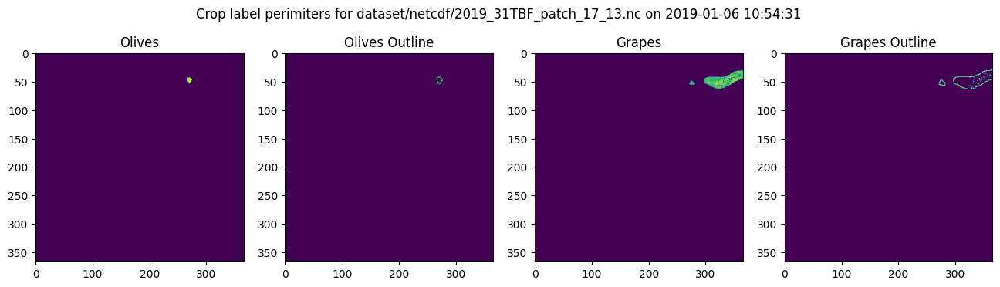

In [17]:
# Plot
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))
ftime = patch_data['B02']['band'].isel(time=0).time.dt.strftime("%Y-%m-%d %H:%M:%S").values
fig.suptitle(f'Crop label perimiters for {patch_data["file"]} on {ftime}')
olives_outline = draw_outline_image(olives, 1500)
ax[0].imshow(olives)
ax[0].set_title('Olives')
ax[1].imshow(olives_outline)
ax[1].set_title('Olives Outline')
grapes_outline = draw_outline_image(grapes, 1500)
ax[2].imshow(grapes)
ax[2].set_title('Grapes')
ax[3].imshow(grapes_outline)
_ = ax[3].set_title('Grapes Outline')

## View Parcel Properties

In [18]:
patch_data['parcels'].parcels[0,0]

<xarray.DataArray 'parcels' ()> Size: 4B
array(0, dtype=uint32)
Coordinates:
    band     int64 8B ...
    y        float64 8B 4.552e+06
    x        float64 8B 2.622e+05
Attributes:
    transform:      [ 1.00000e+01  0.00000e+00  2.62200e+05  0.00000e+00 -1.0...
    crs:            +init=epsg:32631
    res:            [10. 10.]
    is_tiled:       0
    nodatavals:     nan
    scales:         1.0
    offsets:        0.0
    AREA_OR_POINT:  Area

## Show one year of monthly patch data from the `patch_year` specified in the object

Question: why is .median used here?  Is it only to demonstrate interpolation?

.mean seems like it would make better use of the available data

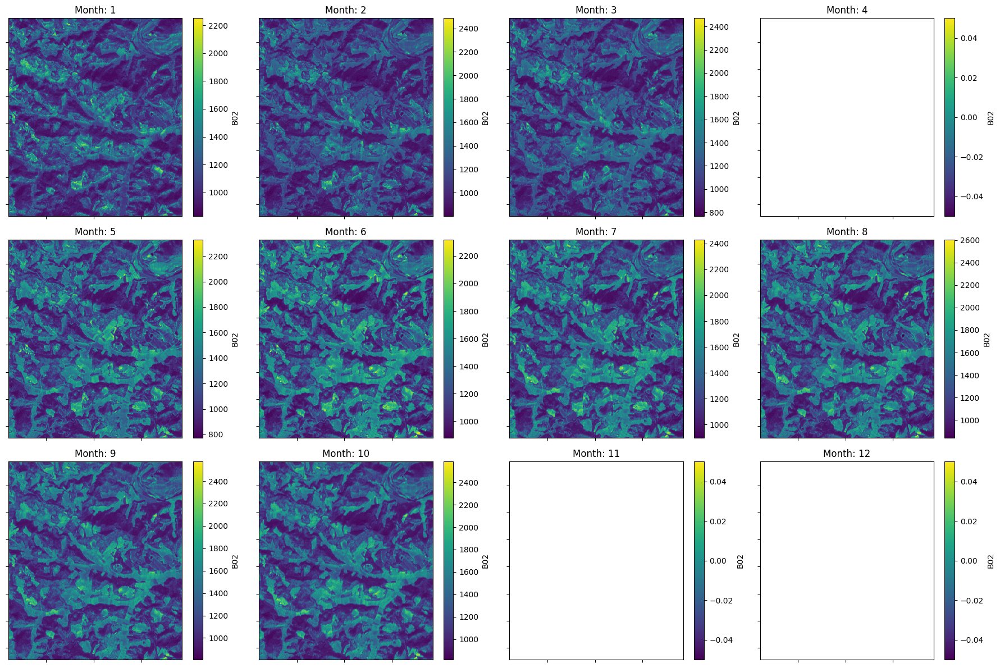

In [19]:
# Or maybe aggregate based on a given frequency
# Refer to
# https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#timeseries-offset-aliases
group_freq = '1MS'

# Grab year from netcdf4's global attribute
year = patch.patch_year

# output intervals
date_range = pd.date_range(start=f'{year}-01-01', end=f'{int(year) + 1}-01-01', freq=group_freq)

# Aggregate based on given frequency
band_data = patch_data['B02']['band'].groupby_bins(
    'time',
    bins=date_range,
    right=True,
    include_lowest=False,
    labels=date_range[:-1]
).median(dim='time')

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(18, 12))
for i, season in enumerate(band_data):
    ax = axes.flat[i]
    cax = band_data.isel(time_bins=i).plot(ax=ax)
for i, ax in enumerate(axes.flat):
    ax.axes.get_xaxis().set_ticklabels([])
    ax.axes.get_yaxis().set_ticklabels([])
    ax.axes.axis('tight')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(f'Month: {i+1}')
plt.tight_layout()
plt.show()

## Interpolate to fill in missing values

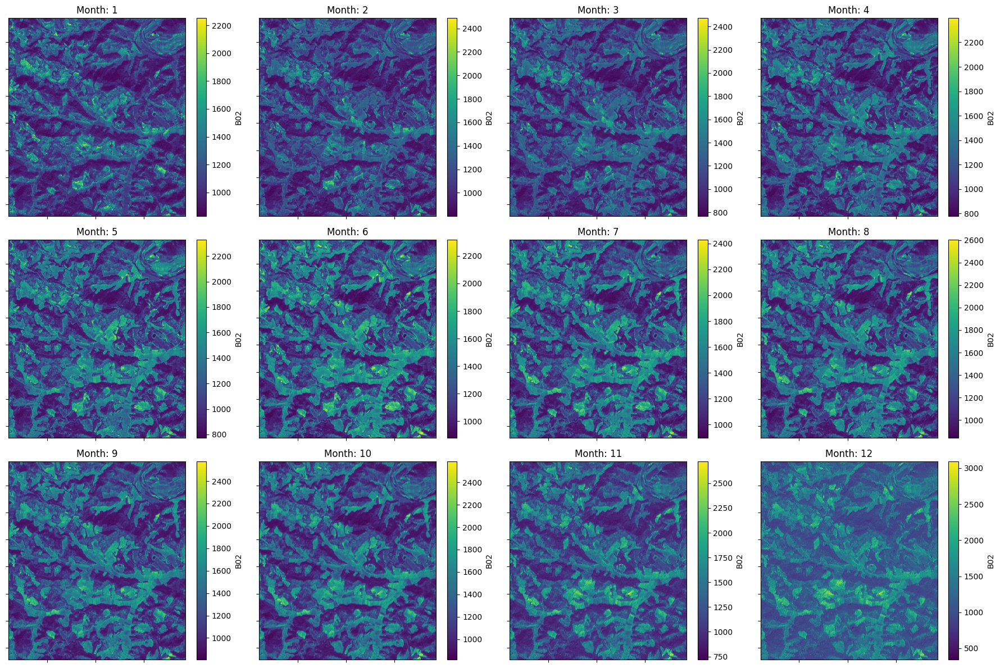

In [20]:
band_data2 = band_data.interpolate_na(dim='time_bins', method='linear', fill_value='extrapolate')
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(18, 12))
for i, season in enumerate(band_data2):
    ax = axes.flat[i]
    cax = band_data2.isel(time_bins=i).plot(ax=ax)
for i, ax in enumerate(axes.flat):
    ax.axes.get_xaxis().set_ticklabels([])
    ax.axes.get_yaxis().set_ticklabels([])
    ax.axes.axis('tight')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(f'Month: {i+1}')
plt.tight_layout()
plt.show()

## Show histograms of the patch

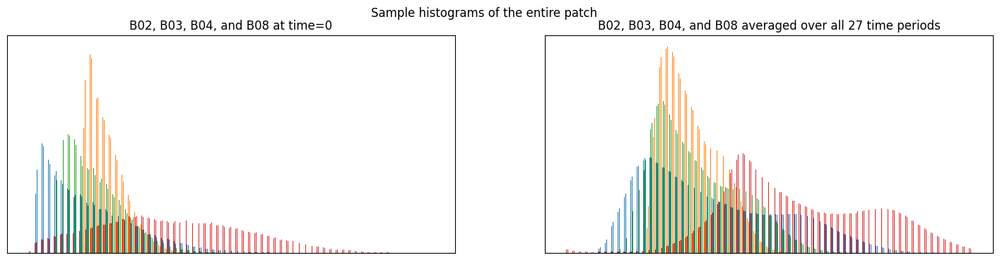

In [21]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 4))
fig.suptitle(f'Sample histograms of the entire patch')
ax0 = axes[0].hist([
        np.array(patch_data['B04']['band'].isel(time=0)).flatten(),
        np.array(patch_data['B02']['band'].isel(time=0)).flatten(),
        np.array(patch_data['B03']['band'].isel(time=0)).flatten(),
        np.array(patch_data['B08']['band'].isel(time=0)).flatten()
], bins=256)
axes[0].set_xticks([])
axes[0].set_yticks([])

_ = axes[0].set_title(f'B02, B03, B04, and B08 at time=0')
ax1 = axes[1].hist([
        patch_data['B04']['uint8'].flatten(),
        patch_data['B02']['uint8'].flatten(),
        patch_data['B03']['uint8'].flatten(),
        patch_data['B08']['uint8'].flatten()
], bins=256)
_ = axes[1].set_title(f'B02, B03, B04, and B08 averaged over all {patch_data["B04"]["uint8"].shape[0]} time periods')
axes[1].set_xticks([])
axes[1].set_yticks([])

plt.show()

## A Visualization of the various 10m Channel Views: Red, Green, Blue, and NIR

#### Combine Blue, Green, and Red channels into an RGB image

In [22]:
def visualize_patch_1(_bands, time=0):

    B02 = _bands['B02']['band'].isel(time=time)
    B03 = _bands['B03']['band'].isel(time=time)
    B04 = _bands['B04']['band'].isel(time=time)
    B08 = _bands['B08']['band'].isel(time=time)

    blue8 = _bands['B02']['uint8']
    green8 = _bands['B03']['uint8']
    red8 = _bands['B04']['uint8']
    nir8 = _bands['B08']['uint8']

    all_bands = [_bands['B02'], _bands['B03'], _bands['B04'], _bands['B08']]
    
    bmean = np.mean([np.array(b["band"].isel(time=0)) for b in all_bands], axis=0)
    print(f'{bmean.shape}, {bmean.dtype}')
    
    fig = plt.figure(figsize=(18, 7))
    gs = fig.add_gridspec(nrows=4, ncols=4, width_ratios=[1, 2, 2, 7])
    
    xmin = 0
    xmax = np.max(np.concatenate((np.array(B02).flatten(), np.array(B03).flatten(), np.array(B04).flatten())))
    print(f'xlim: {xmin} - {xmax}')
    
    ymin = 0
    ymax = 120000
    
    for n,band in enumerate(all_bands):
        ax = fig.add_subplot(gs[n, 0])
        ax.hist(np.array(band['band']).flatten(), bins=128, facecolor=band['plotc'])
        #ax.hist(blue8.astype("float32").flatten(), bins=100, facecolor='b')
        ax.set_title(band['title'])
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_ylim((ymin,ymax))
        ax.set_xlim((xmin,xmax))
    
        axim = fig.add_subplot(gs[n, 1])
        axim.imshow(band['band'].isel(time=0), cmap='gray')
        axim.set_xticks([])
        axim.set_yticks([])
    
        axim = fig.add_subplot(gs[n, 2])
        axim.imshow(band['band'].isel(time=0) - bmean, cmap='gray')
        axim.set_xticks([])
        axim.set_yticks([])
    
    axim = fig.add_subplot(gs[:, -1])
    rgb3 = np.dstack((red8[0], green8[0], blue8[0]))
    print(f'rgb shape:', rgb3.shape)
    axim.imshow(rgb3)
    axim.set_xticks([])
    axim.set_yticks([])
    
    fig.tight_layout()
    fig.subplots_adjust(wspace=-0.1)
    
    plt.show()

(366, 366), float64
xlim: 0 - 3827
rgb shape: (366, 366, 3)


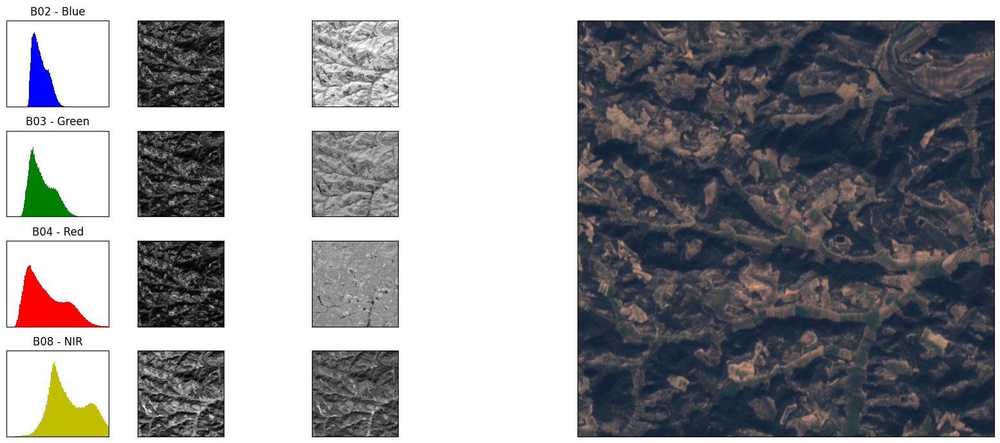

In [23]:
visualize_patch_1(patch_data, time=0)

In [24]:
def visualize_patch_2(_bands, time=0):
    B02 = _bands['B02']['band'].isel(time=time)
    B03 = _bands['B03']['band'].isel(time=time)
    B04 = _bands['B04']['band'].isel(time=time)
    B08 = _bands['B08']['band'].isel(time=time)

    blue8 = _bands['B02']['uint8'][time]
    green8 = _bands['B03']['uint8'][time]
    red8 = _bands['B04']['uint8'][time]
    nir8 = _bands['B08']['uint8'][time]
    
    all_bands = [_bands['B02'], _bands['B03'], _bands['B04'], _bands['B08']]

    bmean = np.mean([np.array(b["band"])[0] for b in all_bands], axis=0)
    fig = plt.figure(figsize=(18, 7))
    gs = fig.add_gridspec(nrows=4, ncols=5, width_ratios=[2, 2, 2, 6, 2])
    
    xmin = 0
    xmax = np.max(np.concatenate((np.array(B02).flatten(), np.array(B03).flatten(), np.array(B04).flatten())))
    
    ymin = 0
    ymax = 5500
    
    for n,band in enumerate(all_bands):

        axim1 = fig.add_subplot(gs[n, 0])
        axim1.imshow(band['band'].isel(time=time), cmap='gray')
        axim1.set_title('amplitude ')
        axim1.set_ylabel(band['title'], fontsize=16)
    
        ax = fig.add_subplot(gs[n, 1])
        ax.hist(np.array(band['band'].isel(time=time)).flatten(), bins=128, facecolor=band['plotc'])

        ax.set_title('histogram')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_ylim((ymin,ymax))
        ax.set_xlim((xmin,xmax))
    
        axim2 = fig.add_subplot(gs[n, 2])
        axim2.imshow(band['band'].isel(time=time) - bmean, cmap='gray')
        axim2.set_title('mean delta')
        axim2.set_xticks([])
        axim2.set_yticks([])
    
    axim = fig.add_subplot(gs[:, 3])
    rgb3 = np.dstack((red8, green8, blue8))
    axim.imshow(rgb3)
    band_time = band['band'].isel(time=time).time.dt.isocalendar()
    band_dict = band_time.to_dict()
    axim.set_title('Combined Channels R,G, and B at ' + str(band_dict["coords"]["time"]["data"]))
    axim.set_xlabel(f'Pixel Dimensions: {rgb3.shape} px / 10m per pixel / {rgb3.shape[0]*10}x{rgb3.shape[1]*10} meters')
    
    NDVI = (B08 - B04) / (B08 + B04)
    ax_ndvi = fig.add_subplot(gs[0, -1])
    ax_ndvi.imshow(np.array(NDVI))
    ax_ndvi.set_title('NDVI')
    ax_ndvi.set_xticks([])
    ax_ndvi.set_yticks([])
    
    ax_ndvi_h = fig.add_subplot(gs[1, -1])
    ax_ndvi_h.hist(np.array(NDVI).flatten(), bins=128, facecolor=band['plotc'])
    ax_ndvi_h.set_title('NDVI Histogram')
    ax_ndvi_h.set_ylim((0, 3))
    ax_ndvi_h.set_xticks([])
    ax_ndvi_h.set_yticks([])
    
    NDWI = (B03 - B08) / (B03 + B08)
    ax_ndwi = fig.add_subplot(gs[2, -1])
    ax_ndwi.imshow(NDWI)
    ax_ndwi.set_title('NDWI')
    ax_ndwi.set_xticks([])
    ax_ndwi.set_yticks([])
    
    ax_ndwi_h = fig.add_subplot(gs[3, -1])
    ax_ndwi_h.hist(np.array(NDWI).flatten(), bins=128, facecolor=band['plotc'])
    ax_ndwi.set_title('NDWI')
    ax_ndwi_h.set_title('NDWI Histogram')
    ax_ndwi_h.set_ylim((0, 3500))
    ax_ndwi_h.set_xticks([])
    ax_ndwi_h.set_yticks([])
    
    fig.tight_layout()
    fig.subplots_adjust(wspace=-0.2)
    
    plt.show()

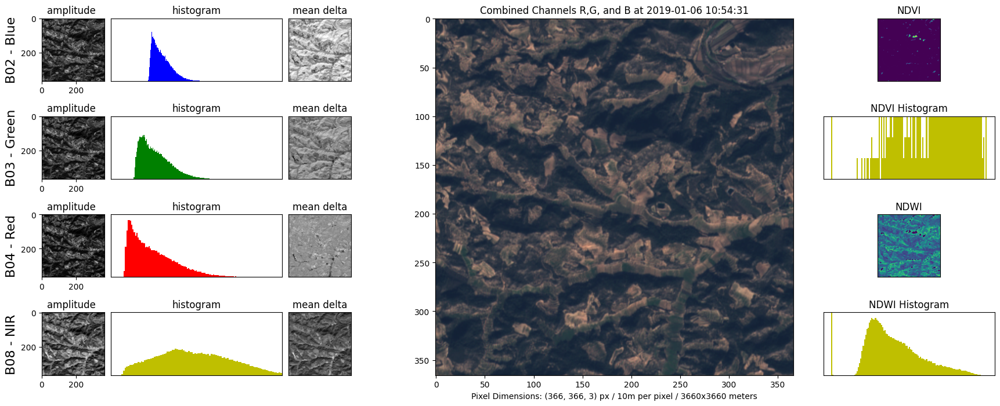

In [25]:
visualize_patch_2(patch_data, time=0)

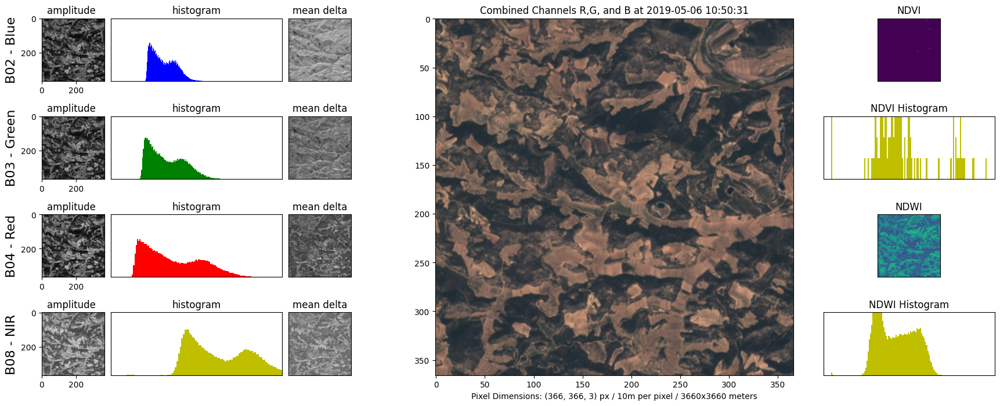

In [26]:
visualize_patch_2(patch_data, time=4)

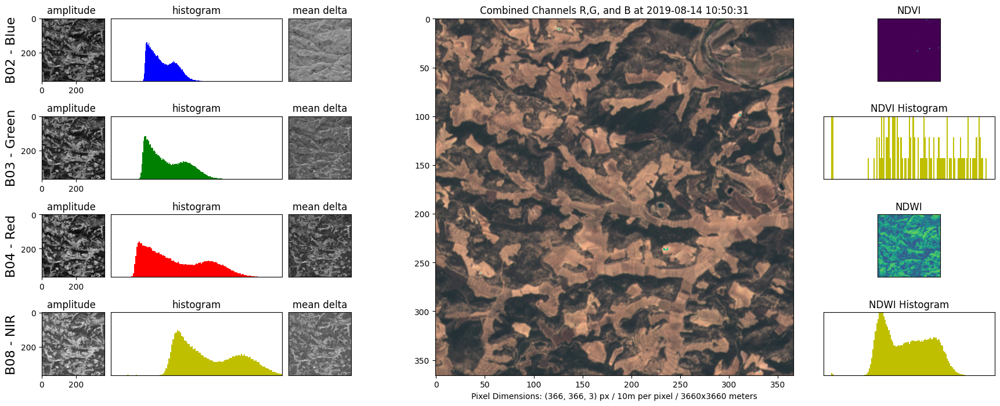

In [27]:
visualize_patch_2(patch_data, time=10)

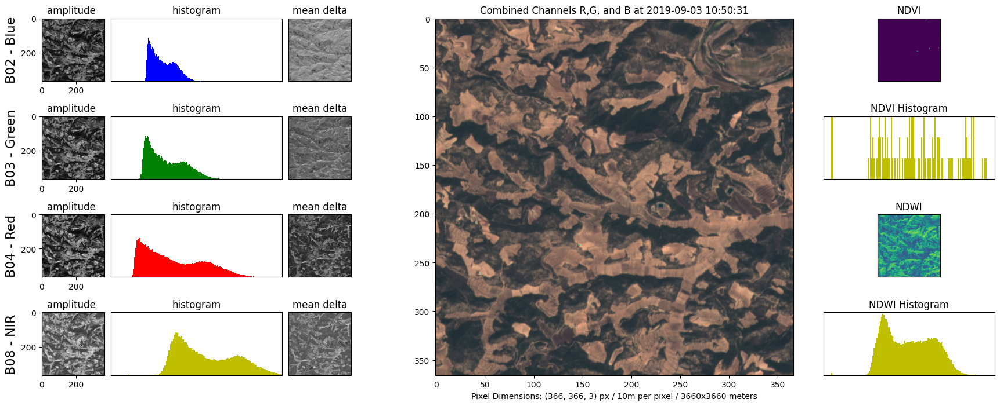

In [28]:
visualize_patch_2(patch_data, time=12)

## TODO

1. Set histogram width to 1:1 ratio
2. 2D histograms with time
3. Plot residuals
4. Plot a small section of a patch
5. Plot a crop type using a mask 

In [29]:
def plot_im(ax, key, im):
    _ = ax.imshow(np.array(im))
    _ = ax.set_title(key)
    _ = ax.set_xticks([])
    _ = ax.set_yticks([])

In [30]:
def plot_hist(ax, key, arr, ylim, color='gray'):
    _ = ax.hist(np.array(arr).flatten(), bins=128, facecolor=color)
    _ = ax.set_title(f'{key} Histogram')
    _ = ax.set_ylim((0, ylim))
    _ = ax.set_xticks([])
    _ = ax.set_yticks([])

In [31]:
def plot_bar3d(ax, band):
    max = np.max(band)
    #cmap = plt.cm.get_cmap('jet')
    cmap = plt.colormaps['jet']
    nbins = 16
    fig = plt.figure()
    for n in range(band.shape[0]):
        hist, _ = np.histogram(band[n,:,:], bins=nbins)
        width = depth = 1
        z = np.zeros(hist.shape[0])
        rgba = [cmap((k-np.min(band))/np.max(band)*.10) for k in hist]
        _ = ax.bar3d(np.arange(nbins), n, z, width, depth, hist, color=rgba, shade=True)
    _ = ax.set_xticks([])
    #_ = ax.set_yticks([])
    _ = ax.set_zticks([])

In [47]:
def draw_outline_image2(image, color=np.array([0, 0, 0xFF], dtype=np.uint8)):
    print(f'image.shape: {image.shape}')
    outline_image = image.copy()
    indicies = np.where((outline_image > 0))
    
    # Expand the image by 1 pixel on all sides
    # TODO: determine how to do this without a loop; maybe consider generic_filter
    ai = np.array(indicies) + 1
    print(f'ai.shape: {ai.shape}')
    for addsub in [-1, 1]:
        for idx in range(2):
            for n in range(2):
                ai=np.clip(ai, 0, 365)
                outline_image[tuple(ai)] = color
                ai[idx] = np.array(indicies)[idx] + addsub
    
    # Remove center
    outline_image[image > 0] = 0
    return outline_image

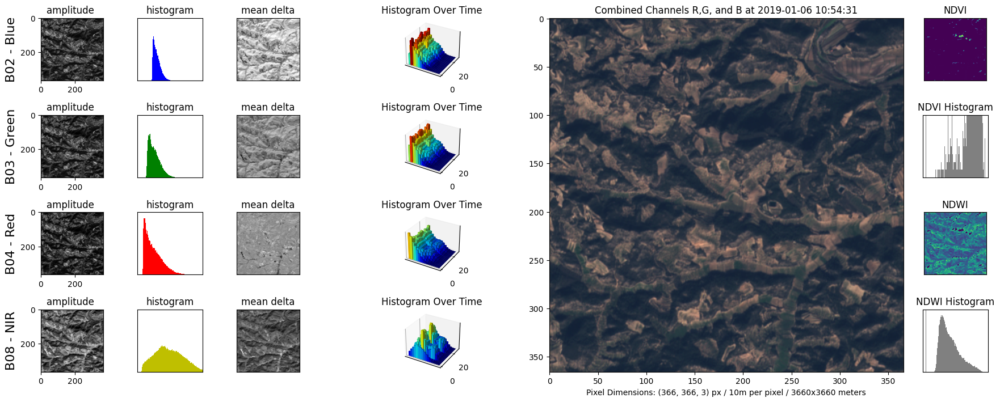

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [48]:
def visualize_patch_3(_bands, time=0):
    B02 = _bands['B02']['band'].isel(time=time)
    B03 = _bands['B03']['band'].isel(time=time)
    B04 = _bands['B04']['band'].isel(time=time)
    B08 = _bands['B08']['band'].isel(time=time)

    blue8 = _bands['B02']['uint8'][time]
    green8 = _bands['B03']['uint8'][time]
    red8 = _bands['B04']['uint8'][time]
    nir8 = _bands['B08']['uint8'][time]

    all_bands = [_bands['B02'], _bands['B03'], _bands['B04'], _bands['B08']]

    #bmean = np.mean([np.array(b["band"]) for b in _bands.values()], axis=0)
    bmean = np.mean([np.array(b["band"])[0] for b in all_bands], axis=0)
    
    fig = plt.figure(figsize=(18, 7))
    gs = fig.add_gridspec(nrows=4, ncols=6, width_ratios=[2, 1, 2, 3, 6, 1])
    
    xmin = 0
    xmax = np.max(np.concatenate((np.array(B02).flatten(), np.array(B03).flatten(), np.array(B04).flatten())))
    
    ymin = 0
    ymax = 5500
    
    for n,band in enumerate(all_bands):

        axim1 = fig.add_subplot(gs[n, 0])
        _ = axim1.imshow(band['band'].isel(time=time), cmap='gray')
        _ = axim1.set_title('amplitude ')
        _ = axim1.set_ylabel(band['title'], fontsize=16)
    
        ax = fig.add_subplot(gs[n, 1])
        _ = ax.hist(np.array(band['band'].isel(time=time)).flatten(), bins=128, facecolor=band['plotc'])

        ax.set_title('histogram')
        _ = ax.set_xticks([])
        _ = ax.set_yticks([])
        _ = ax.set_ylim((ymin,ymax))
        _ = ax.set_xlim((xmin,xmax))
    
        axim2 = fig.add_subplot(gs[n, 2])
        _ = axim2.imshow(band['band'].isel(time=time) - bmean, cmap='gray')
        _ = axim2.set_title('mean delta')
        _ = axim2.set_xticks([])
        _ = axim2.set_yticks([])

        ax3d = fig.add_subplot(gs[n, 3], projection='3d')
        _ = plot_bar3d(ax3d, band['band'])
        _ = ax3d.set_title('Histogram Over Time')

    axim = fig.add_subplot(gs[:, 4])
    rgb3 = np.dstack((red8, green8, blue8))
    _ = axim.imshow(rgb3)
    band_time = B02.time.dt.isocalendar()
    band_dict = band_time.to_dict()
    _ = axim.set_title('Combined Channels R,G, and B at ' + str(band_dict["coords"]["time"]["data"]))
    _ = axim.set_xlabel(f'Pixel Dimensions: {rgb3.shape} px / 10m per pixel / {rgb3.shape[0]*10}x{rgb3.shape[1]*10} meters')
    
    NDVI = (B08 - B04) / (B08 + B04)
    NDWI = (B03 - B08) / (B03 + B08)

    ax_ndvi = fig.add_subplot(gs[0, -1])
    _ = plot_im(ax_ndvi, 'NDVI', NDVI)
    ax_ndvi_h = fig.add_subplot(gs[1, -1])
    _ = ax_ndvi_h.hist(np.array(NDVI).flatten(), bins=128, facecolor=band['plotc'])
    _ = plot_hist(ax_ndvi_h, 'NDVI', NDVI, 8)

    ax_ndwi = fig.add_subplot(gs[2, -1])
    _ = plot_im(ax_ndwi, 'NDWI', NDWI)
    ax_ndwi_h = fig.add_subplot(gs[3, -1])
    _ = ax_ndwi_h.hist(np.array(NDWI).flatten(), bins=128, facecolor=band['plotc'])
    _ = plot_hist(ax_ndwi_h, 'NDWI', NDWI, 3500)

    _ = fig.tight_layout()
    _ = fig.subplots_adjust(wspace=0)
    
    _ = plt.show()

visualize_patch_3(patch_data, time=0)

[  0 330 353 442]
image.shape: (366, 366, 3)
ai.shape: (3, 401868)


ValueError: shape mismatch: value array of shape (3,) could not be broadcast to indexing result of shape (401868,)

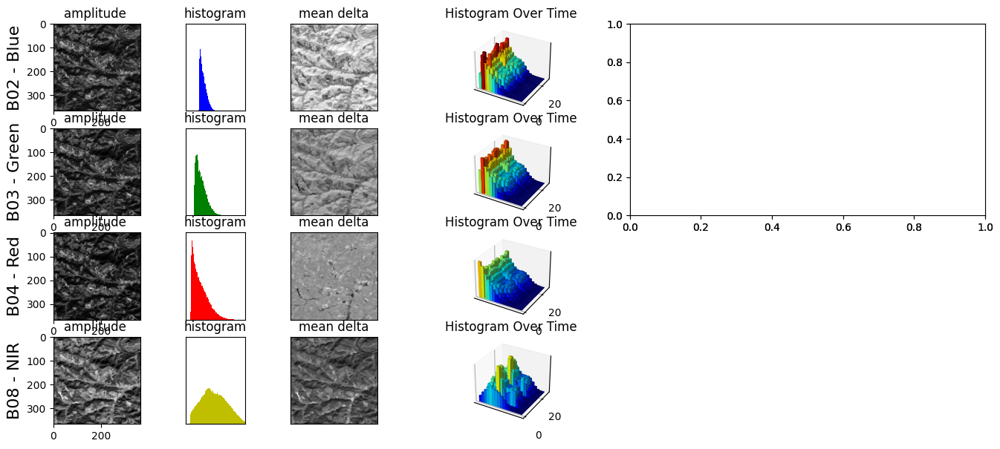

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [49]:
def visualize_label(_bands, time=0, label_idx=2):

    B02 = _bands['B02']['band'].isel(time=time)
    B03 = _bands['B03']['band'].isel(time=time)
    B04 = _bands['B04']['band'].isel(time=time)
    B08 = _bands['B08']['band'].isel(time=time)

    blue8 = _bands['B02']['uint8'][time]
    green8 = _bands['B03']['uint8'][time]
    red8 = _bands['B04']['uint8'][time]
    nir8 = _bands['B08']['uint8'][time]

    all_bands = [_bands['B02'], _bands['B03'], _bands['B04'], _bands['B08']]
    bmean = np.mean([np.array(b["band"])[0] for b in all_bands], axis=0)
    
    fig = plt.figure(figsize=(18, 7))
    gs = fig.add_gridspec(nrows=4, ncols=6, width_ratios=[2, 1, 2, 3, 6, 1])
    
    xmin = 0
    xmax = np.max(np.concatenate((np.array(B02).flatten(), np.array(B03).flatten(), np.array(B04).flatten())))
    
    ymin = 0
    ymax = 5500
    
    for n,band in enumerate(all_bands):

        axim1 = fig.add_subplot(gs[n, 0])
        _ = axim1.imshow(band['band'].isel(time=time), cmap='gray')
        _ = axim1.set_title('amplitude ')
        _ = axim1.set_ylabel(band['title'], fontsize=16)
    
        ax = fig.add_subplot(gs[n, 1])
        _ = ax.hist(np.array(band['band'].isel(time=time)).flatten(), bins=128, facecolor=band['plotc'])

        ax.set_title('histogram')
        _ = ax.set_xticks([])
        _ = ax.set_yticks([])
        _ = ax.set_ylim((ymin,ymax))
        _ = ax.set_xlim((xmin,xmax))
    
        axim2 = fig.add_subplot(gs[n, 2])
        _ = axim2.imshow(band['band'].isel(time=time) - bmean, cmap='gray')
        _ = axim2.set_title('mean delta')
        _ = axim2.set_xticks([])
        _ = axim2.set_yticks([])

        ax3d = fig.add_subplot(gs[n, 3], projection='3d')
        _ = plot_bar3d(ax3d, band['band'])
        _ = ax3d.set_title('Histogram Over Time')

    axim = fig.add_subplot(gs[0:2, 4])
    rgb3 = np.dstack((red8, green8, blue8))

    label_array = np.array(patch_data['labels'].to_dataarray()[0])
    unique_labels = np.unique(label_array)
    print(unique_labels)

    grapes = rgb3.copy()
    #grapes[label_array!=CROP_ENCODING['Grapes']] = np.array([0, 0, 0])

    axmask = fig.add_subplot(gs[0:2, 4])
    ftime = patch_data['B02']['band'].isel(time=0).time.dt.strftime("%Y-%m-%d %H:%M:%S").values
    grapes_outline = draw_outline_image2(grapes, [0, 0, 0xFF])
    axmask.imshow(grapes_outline)
    _ = ax[2].set_title('Perimiters for `Grapes` in {patch_data["file"]} on {ftime}')
    #_ = ax[3].set_title('Grapes Outline')

    _ = axim.imshow(rgb3)
    band_time = B02.time.dt.isocalendar()
    band_dict = band_time.to_dict()
    _ = axim.set_title('Combined Channels R,G, and B at ' + str(band_dict["coords"]["time"]["data"]))
    _ = axim.set_xlabel(f'Pixel Dimensions: {rgb3.shape} px / 10m per pixel / {rgb3.shape[0]*10}x{rgb3.shape[1]*10} meters')
    
    NDVI = (B08 - B04) / (B08 + B04)
    NDWI = (B03 - B08) / (B03 + B08)

    ax_ndvi = fig.add_subplot(gs[0, -1])
    _ = plot_im(ax_ndvi, 'NDVI', NDVI)
    ax_ndvi_h = fig.add_subplot(gs[1, -1])
    _ = ax_ndvi_h.hist(np.array(NDVI).flatten(), bins=128, facecolor=band['plotc'])
    _ = plot_hist(ax_ndvi_h, 'NDVI', NDVI, 8)

    ax_ndwi = fig.add_subplot(gs[2, -1])
    _ = plot_im(ax_ndwi, 'NDWI', NDWI)
    ax_ndwi_h = fig.add_subplot(gs[3, -1])
    _ = ax_ndwi_h.hist(np.array(NDWI).flatten(), bins=128, facecolor=band['plotc'])
    _ = plot_hist(ax_ndwi_h, 'NDWI', NDWI, 3500)

    _ = fig.tight_layout()
    _ = fig.subplots_adjust(wspace=-0.2)
    
    _ = plt.show()

visualize_label(patch_data, time=0, label_idx=2)

In [39]:
366*366

133956

In [46]:
366*366*3

401868

[  0 330 353 442]
(366, 366, 3)


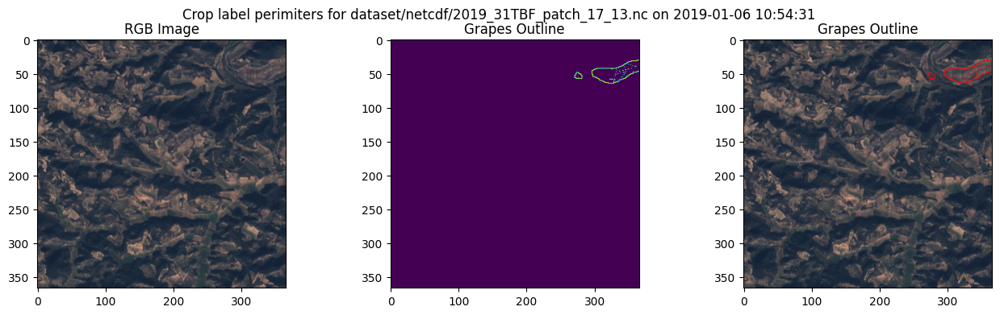

In [68]:
# This function draws an outline around all non-zero pixels and then zeros 
def draw_rgb_outline(image, color=np.array([0, 0, 0xFF], dtype=np.uint8)):
    print(f'image.shape: {image.shape}')
    outline_image = image.copy()
    indicies = np.where((outline_image > 0))
    
    # Expand the image by 1 pixel on all sides
    # TODO: determine how to do this without a loop; maybe consider generic_filter
    ai = np.array(indicies) + 1
    print(f'ai.shape: {ai.shape}')
    for addsub in [-1, 1]:
        for idx in range(2):
            for n in range(2):
                ai=np.clip(ai, 0, 365)
                outline_image[tuple(ai)] = color
                ai[idx] = np.array(indicies)[idx] + addsub
    
    # Remove center
    outline_image[image > 0] = 0
    return outline_image
    
def draw_outline_image(image, color=1):
    outline_image = image.copy()
    indicies = np.where((outline_image > 0))
    
    # Expand the image by 1 pixel on all sides
    # TODO: determine how to do this without a loop; maybe consider generic_filter
    ai = np.array(indicies) + 1
    for addsub in [-1, 1]:
        for idx in range(2):
            for n in range(2):
                ai=np.clip(ai, 0, 365)
                outline_image[tuple(ai)] = color
                ai[idx] = np.array(indicies)[idx] + addsub
    
    # Remove center
    outline_image[image > 0] = 0
    return outline_image

label_array = np.array(patch_data['labels'].to_dataarray()[0])
unique_labels = np.unique(label_array)
print(unique_labels)

# Plot
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16, 4))
ftime = patch_data['B02']['band'].isel(time=0).time.dt.strftime("%Y-%m-%d %H:%M:%S").values
fig.suptitle(f'Crop label perimiters for {patch_data["file"]} on {ftime}')
grapes_outline = draw_outline_image(grapes, 1500)

blue8 = patch_data['B02']['uint8'][0]
green8 = patch_data['B03']['uint8'][0]
red8 = patch_data['B04']['uint8'][0]

rgb3 = np.dstack((red8, green8, blue8))
_ = ax[0].imshow(rgb3)
ax[0].set_title('RGB Image')
ax[1].imshow(grapes_outline)
_ = ax[1].set_title('Grapes Outline')

print(rgb3.shape)
rgb3_2 = rgb3.copy()
rgb3_2[grapes_outline != 0] = [0xFF,0,0]
ax[2].imshow(rgb3_2)
_ = ax[2].set_title('Grapes Outline')